# scRNA-seq analysis with Scanpy #

### Adapted from scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.html

### In this case, I am combining before normalizing to see if that changes the results from the last two iterations.


In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad

In [3]:
sc.settings.verbosity = 3 #get hints
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor = 'white') #recommended figure paramters

scanpy==1.9.8 anndata==0.9.2 umap==0.5.5 numpy==1.24.3 scipy==1.9.1 pandas==1.5.3 scikit-learn==1.2.2 statsmodels==0.14.0 igraph==0.10.8 louvain==0.8.1 pynndescent==0.5.11


### Create result files (where results will be written to) in appropriate directory

In [4]:
#base_directory='OneDrive - case.edu/Scott Lab/rna-seq/'
results_file ='combined_analyzed.h5ad'

### Read in count matrices into AnnData objects and add origin label

note: to avoid an issue where the observations are seen as duplicates after concatenation, I need to modify the barcodes. I'll add a prefix for fused, resistant, parental. ChatGPT was used to figure out how to do that effectively

In [5]:
adata_fus = sc.read_10x_mtx('fused/',
                           var_names='gene_symbols',
                           cache=True)
adata_fus.obs["sample"] = "fused"
barcodes = adata_fus.obs.index
modified_barcodes = [f"F_{barcode}" for barcode in barcodes]
adata_fus.obs.index = modified_barcodes
#adata_fus.obs

... reading from cache file cache/fused-matrix.h5ad


In [6]:
adata_par = sc.read_10x_mtx('parental/',
                           var_names='gene_symbols',
                           cache=True)
adata_par.obs["sample"]= "parental"
barcodes = adata_par.obs.index
modified_barcodes = [f"P_{barcode}" for barcode in barcodes]
adata_par.obs.index = modified_barcodes
#adata_par.obs

... reading from cache file cache/parental-matrix.h5ad


In [7]:
adata_res = sc.read_10x_mtx('resistant/',
                           var_names='gene_symbols',
                           cache=True)
barcodes = adata_res.obs.index
modified_barcodes = [f"R_{barcode}" for barcode in barcodes]
adata_res.obs.index = modified_barcodes
adata_res.obs["sample"] = "resistant"
adata_res.obs

... reading from cache file cache/resistant-matrix.h5ad


,sample
R_AAACCCAAGACGATAT-1,resistant
R_AAACCCAAGCCATATC-1,resistant
R_AAACCCAAGGTCGAGT-1,resistant
R_AAACCCAAGTTACGAA-1,resistant
R_AAACCCACACAGAGCA-1,resistant
...,...
R_TTTGGTTTCAGGACGA-1,resistant
R_TTTGGTTTCGGTGAAG-1,resistant
R_TTTGTTGAGATGGGCT-1,resistant
R_TTTGTTGAGCTGCCTG-1,resistant


In [8]:
adata_fus.var_names_make_unique()
adata_par.var_names_make_unique()
adata_res.var_names_make_unique()

print(adata_fus)
print(adata_par)
print(adata_res)

AnnData object with n_obs × n_vars = 6044 × 36601
    obs: 'sample'
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 10353 × 36601
    obs: 'sample'
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 8513 × 36601
    obs: 'sample'
    var: 'gene_ids', 'feature_types'


## Concatenate into one adata object for processing

In [9]:
adata_combined = ad.concat([adata_fus, adata_par, adata_res])
#note genes are no longer unique I hope that's okay? Should check with Arda

## Preprocessing step 1: show those genes that yield the highest fraction of counts in each single cell, across all cells.

normalizing counts per cell
    finished (0:00:01)


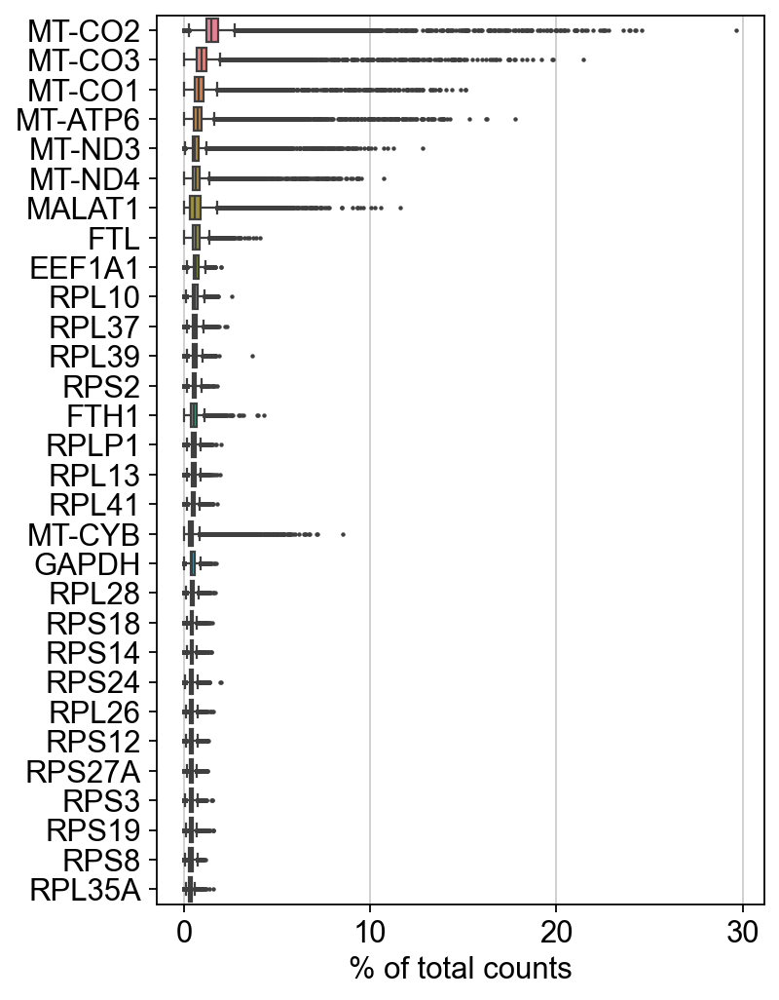

In [10]:
sc.pl.highest_expr_genes(adata_combined, save="_combo")

## Step 2: Basic filtering steps

note: maybe split noncoding from coding and compare

In [11]:
sc.pp.filter_cells(adata_combined, min_genes=200)


In [12]:
sc.pp.filter_genes(adata_combined, min_cells=3)


filtered out 7026 genes that are detected in less than 3 cells


## Step 3: QC w/ Mitochondrial (MT) genes

which genes/transcripts would have GFP/RFP attached to it? --> manually add to gene count table to validate separation of populations --> double check as QC

also: map overall count plots to see if distributions overlap

In [13]:
adata_combined.var['mt'] = adata_combined.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata_combined, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True) #Calculate QC metrics

### Violin plots of relevant QC metrics

/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


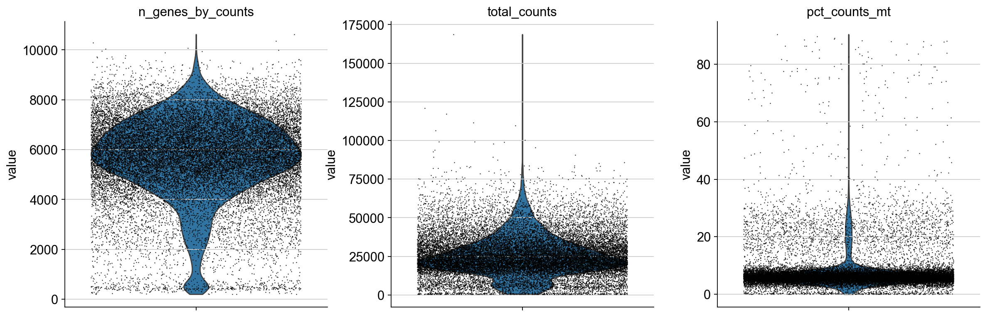

In [14]:
sc.pl.violin(adata_combined, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, save='_combo')

### Use scatterplots to visualize distribution of overall gene-counts and mt-gene counts

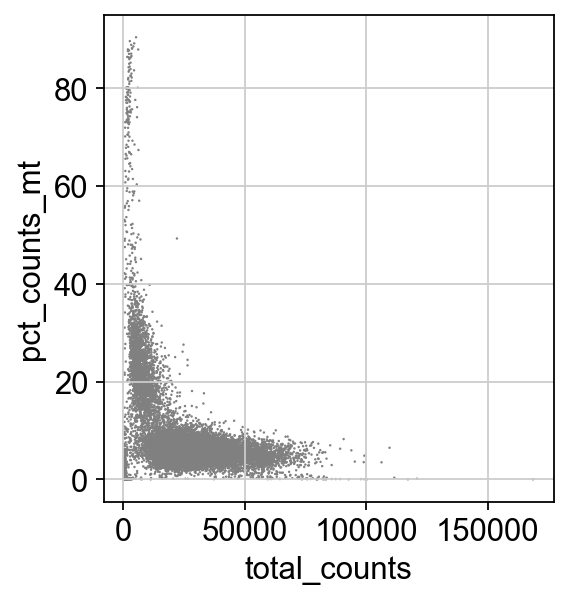

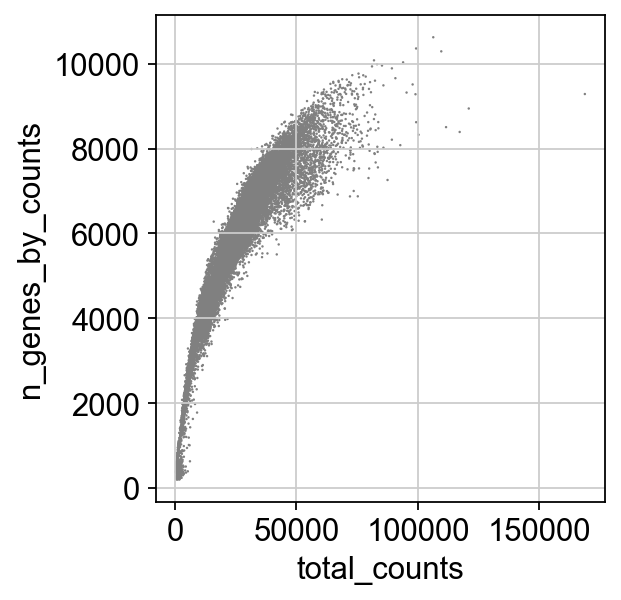

In [15]:
sc.pl.scatter(adata_combined, x='total_counts', y='pct_counts_mt', save="pct_mt_genes_combo")
sc.pl.scatter(adata_combined, x='total_counts', y='n_genes_by_counts', save = "overal_gene_count_combo")

### Filter data to remove outliers

Talked to Arda for advice, who said: "based on these \[results\] I would choose min number of genes identified as 1000, max total count as 70k~75k and pct mt genes as 40%"

alternative that isn't eyeballing it:
adjust so that include 90% of data area of graph to reduce "technical noise" :/

This translates to:

In [16]:
adata_combined_filtered = adata_combined[adata_combined.obs.total_counts<75000,:]
adata_combined_filtered = adata_combined_filtered[adata_combined_filtered.obs.n_genes >1000, :]
adata_combined_filtered = adata_combined_filtered[adata_combined_filtered.obs.pct_counts_mt < 40, :]

### Repeat Scatterplots from Above to visualize effects of filtering

/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


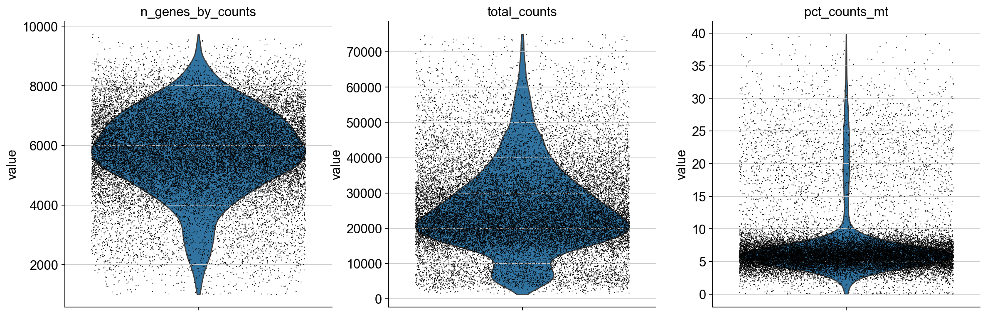

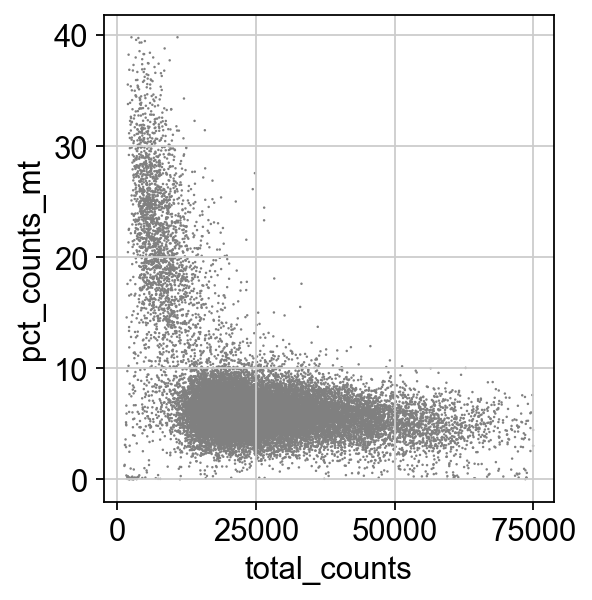

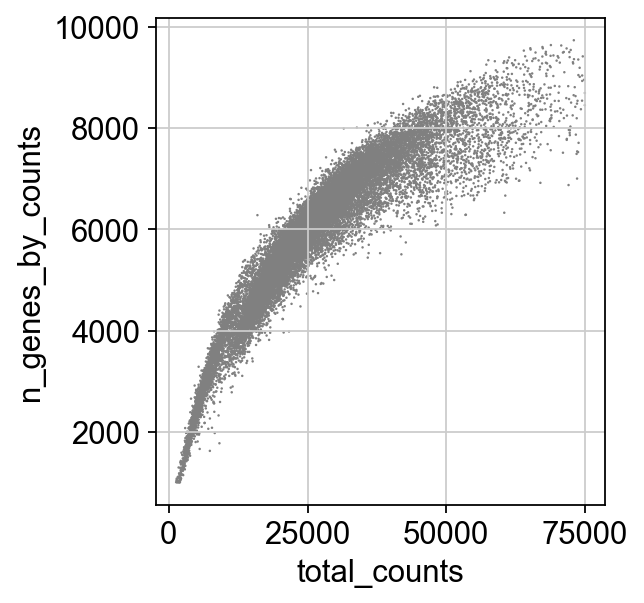

In [17]:
sc.pl.violin(adata_combined_filtered, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, save='_fused_filtered')

sc.pl.scatter(adata_combined_filtered, x='total_counts', y='pct_counts_mt', save="pct_mt_genes_fused_filtered")
sc.pl.scatter(adata_combined_filtered, x='total_counts', y='n_genes_by_counts', save = "overal_gene_count_fused_filtered")

### Normalize total counts + logarithmize the data

The tutorial has the target sum to 1e4 (presumably based on the n_genes_by_counts graph) and based on the higher counts in this study I adjust this to 1e5.

arda: "million is a good number" --> 1e6 now thx

In [18]:
sc.pp.normalize_total(adata_combined_filtered, target_sum=1e6)

/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:01)


arda: there are ways to shift threshold/min value based on library size. 

rowan: could add 100 (1/2 of 200, which is the minimum value pre-normalization)

arda: add .1? b/c .1 < 1

rowan: could also be fine. TBD

In [19]:
sc.pp.log1p(adata_combined_filtered)

### Identify the highly_variable genes

when plotting-- make sure axes are identical to avoid visual distortion

In [20]:
sc.pp.highly_variable_genes(adata_combined_filtered, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:03)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


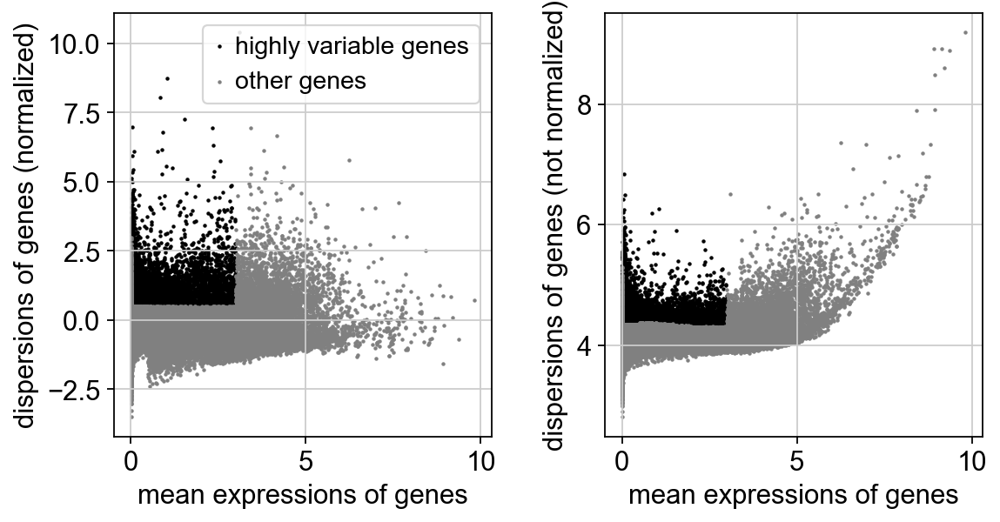

In [21]:
sc.pl.highly_variable_genes(adata_combined_filtered, save="_combined")


### Save the current state of the adata objects

In [22]:
adata_combined_filtered.raw = adata_combined_filtered

### Filter to only include highly expressed genes, regress effects of total counts and mt_genes, scale data to unit variance

In [23]:
adata_combined_filtered = adata_combined_filtered[:, adata_combined_filtered.var.highly_variable]
sc.pp.regress_out(adata_combined_filtered, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adata_combined_filtered, max_value=10)

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:53)


## Principal component analysis (PCA)

In [24]:
sc.tl.pca(adata_combined_filtered, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:10)


AttributeError: 'ColormapRegistry' object has no attribute 'get_cmap'

Stack Overflow said to downgrade to pandas==1.5.3 to solve.

...didn't work trying other options including updating matplotlib

Solution = to export count matrices to onedrive/box and run locally

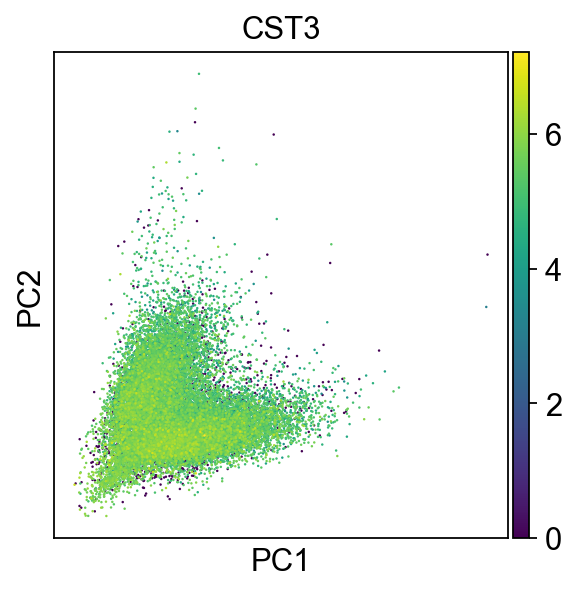

In [25]:
sc.pl.pca(adata_combined_filtered, save='_pca_combo', color="CST3")


## Inspect PCs to determine contributions to neighborhoods

sc.pl.pca_variance_ratio(adata_fus_filtered, log=True, save="_fused")
sc.pl.pca_variance_ratio(adata_par_filtered, log=True, save="_parental")
sc.pl.pca_variance_ratio(adata_res_filtered, log=True, save="_resistant")

## Save results

In [26]:
adata_combined_filtered.write(results_file)

# Compute neighborhood (UMAP) plots

In [27]:
sc.pp.neighbors(adata_combined_filtered)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:12)


## Embed neighborhood graphs

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:14)


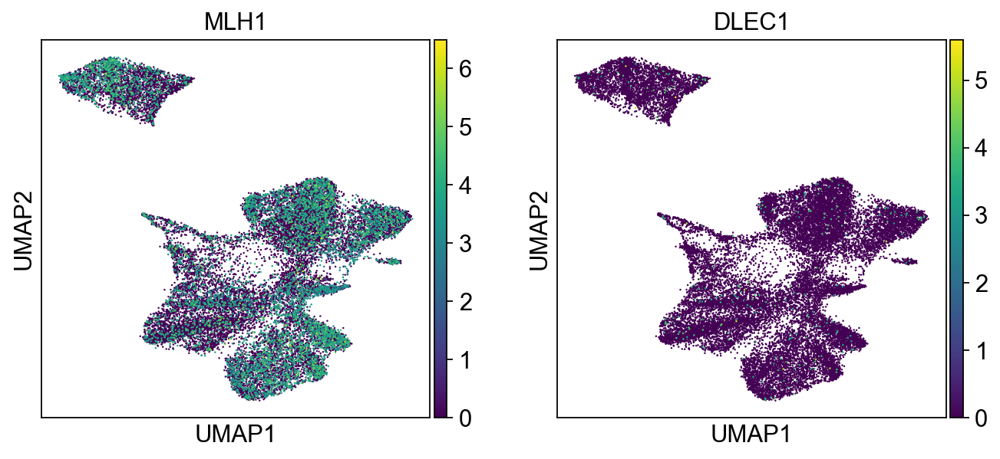

In [28]:
# sc.tl.louvain(adata_fus_filtered)
# sc.tl.paga(adata_fus_filtered)
# sc.pl.paga(adata_fus_filtered, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(adata_combined_filtered, init_pos="random", min_dist=0.1)
sc.pl.umap(adata_combined_filtered, color=['MLH1', 'DLEC1'])

/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


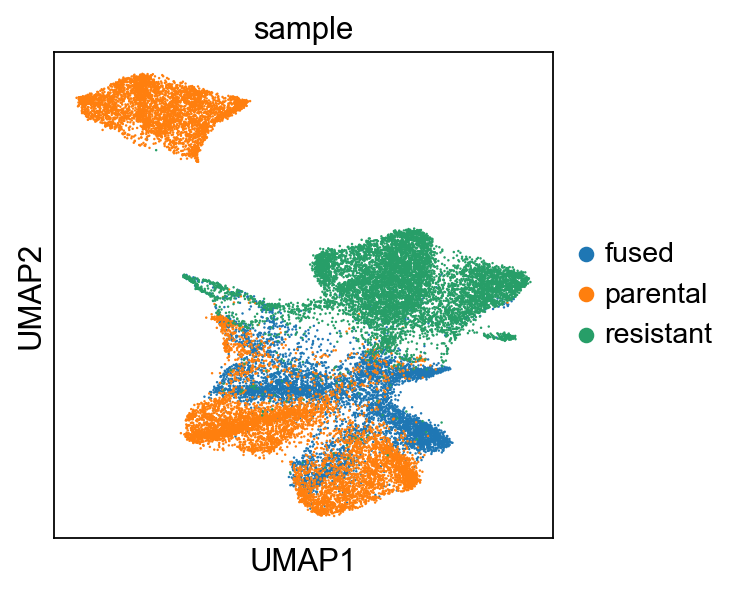

In [29]:
sc.pl.umap(adata_combined_filtered, color="sample")

running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:15)


/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


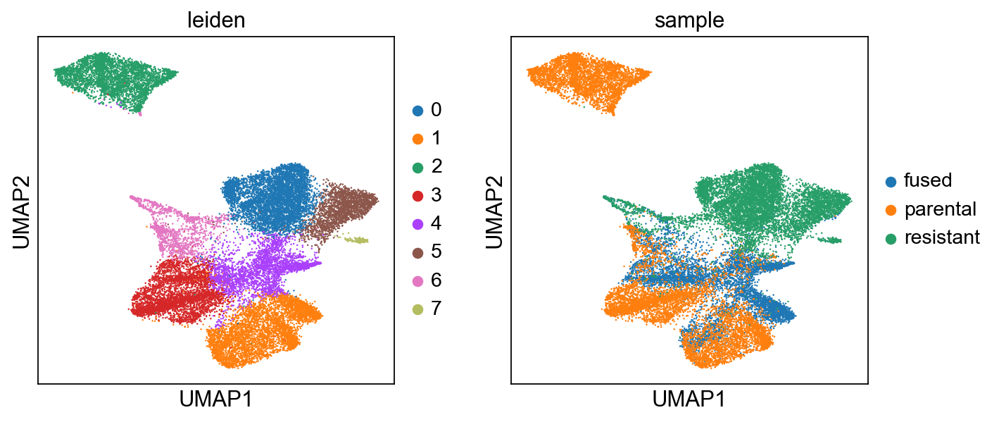

In [31]:
sc.tl.leiden( #leiden clustering algorithm is what determines number of clusters; tutorial has known number of cell types...
    adata_combined_filtered,
    resolution=.5,
    random_state=0,
    n_iterations=-1,
    directed=False,
)

sc.pl.umap(adata_combined_filtered, color=["leiden", "sample"])

running Leiden clustering
    finished: found 5 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:11)


/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


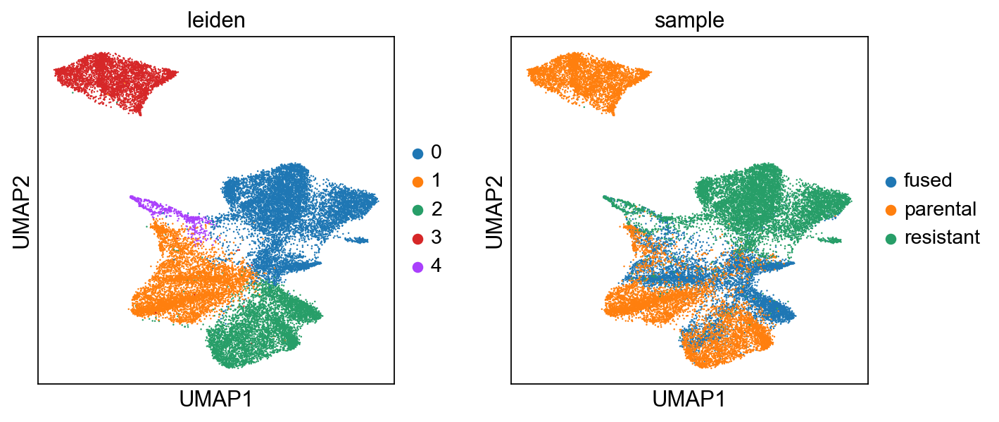

In [32]:
sc.tl.leiden( #leiden clustering algorithm is what determines number of clusters; tutorial has known number of cell types...
    adata_combined_filtered,
    resolution=.25,
    random_state=0,
    n_iterations=-1,
    directed=False,
)

sc.pl.umap(adata_combined_filtered, color=["leiden", "sample"])

running Leiden clustering
    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:11)


/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


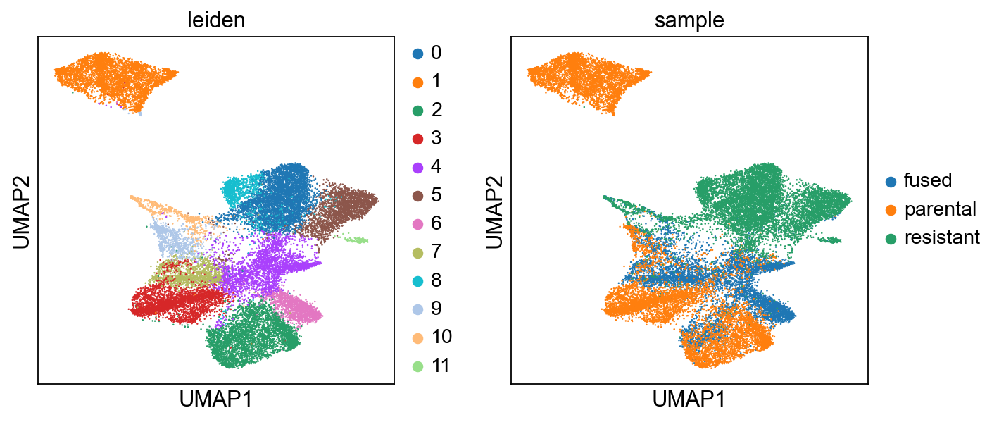

In [33]:
sc.tl.leiden( #leiden clustering algorithm is what determines number of clusters; tutorial has known number of cell types...
    adata_combined_filtered,
    resolution=.75,
    random_state=0,
    n_iterations=-1,
    directed=False,
)

sc.pl.umap(adata_combined_filtered, color=["leiden", "sample"])

running Leiden clustering
    finished: found 9 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:14)


/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


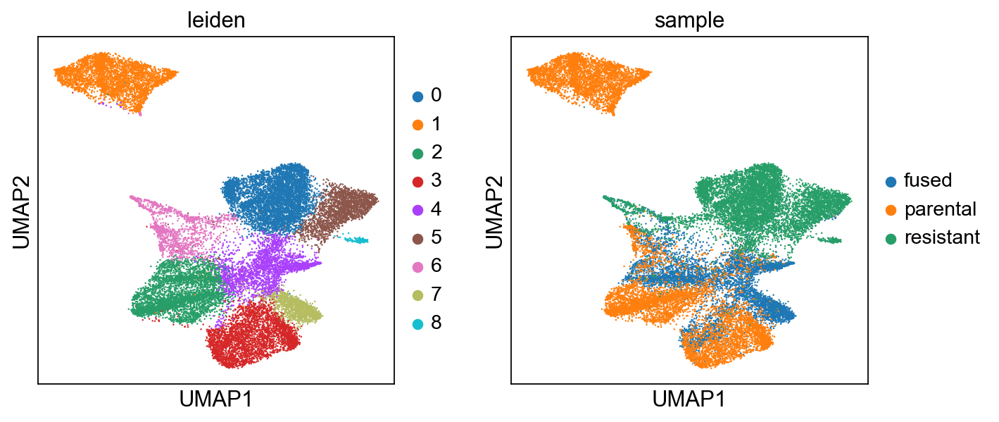

In [34]:
sc.tl.leiden( #leiden clustering algorithm is what determines number of clusters; tutorial has known number of cell types...
    adata_combined_filtered,
    resolution=.6,
    random_state=0,
    n_iterations=-1,
    directed=False,
)

sc.pl.umap(adata_combined_filtered, color=["leiden", "sample"])

running Leiden clustering
    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:12)


/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


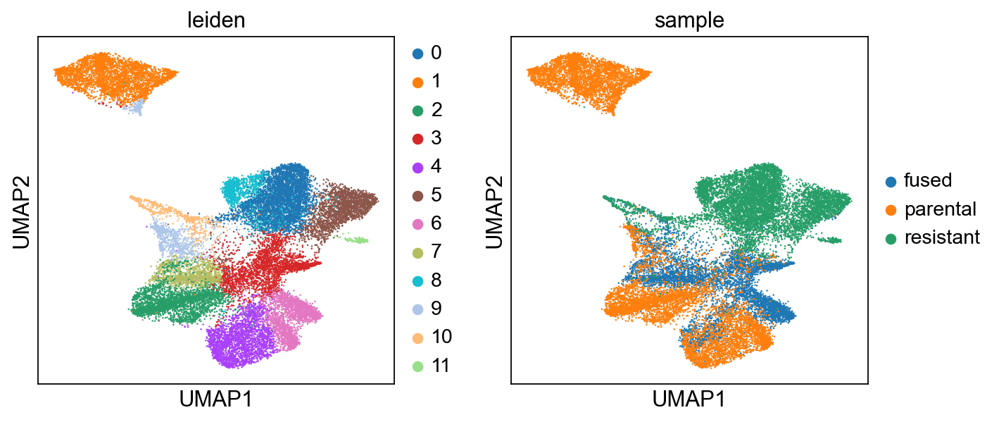

In [35]:
sc.tl.leiden( #leiden clustering algorithm is what determines number of clusters; tutorial has known number of cell types...
    adata_combined_filtered,
    resolution=1,
    random_state=0,
    n_iterations=-1,
    directed=False,
)

sc.pl.umap(adata_combined_filtered, color=["leiden", "sample"])

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:03)


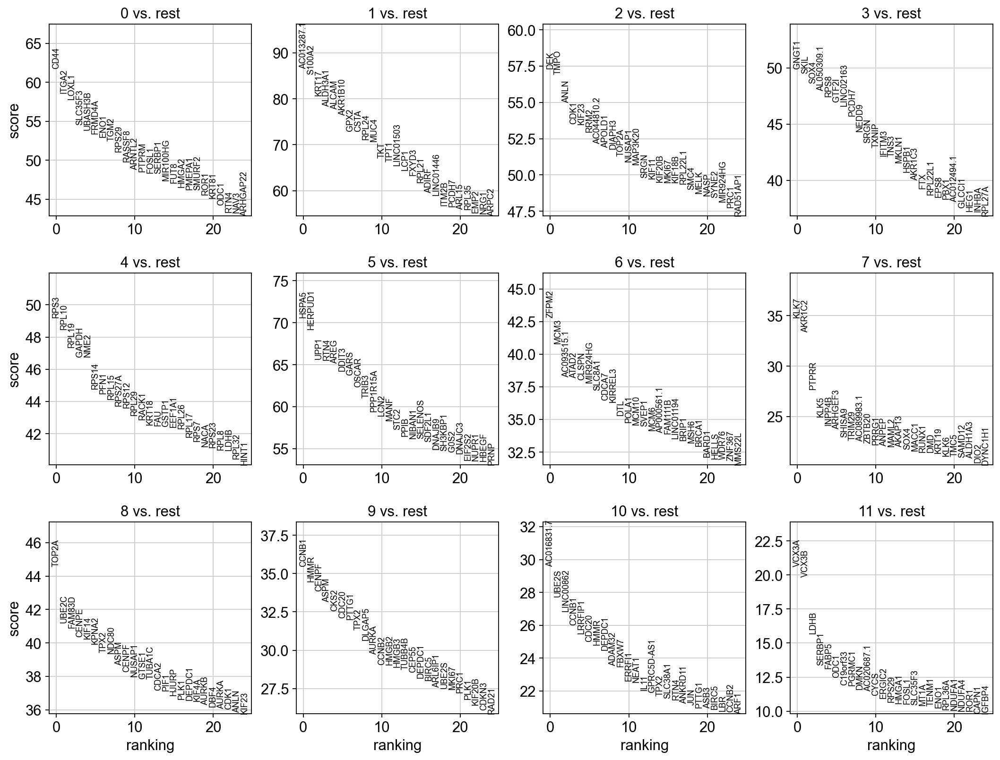

In [33]:
sc.tl.rank_genes_groups(adata_combined_filtered, "leiden", method="wilcoxon")
sc.pl.rank_genes_groups(adata_combined_filtered, n_genes=25, sharey=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:55)


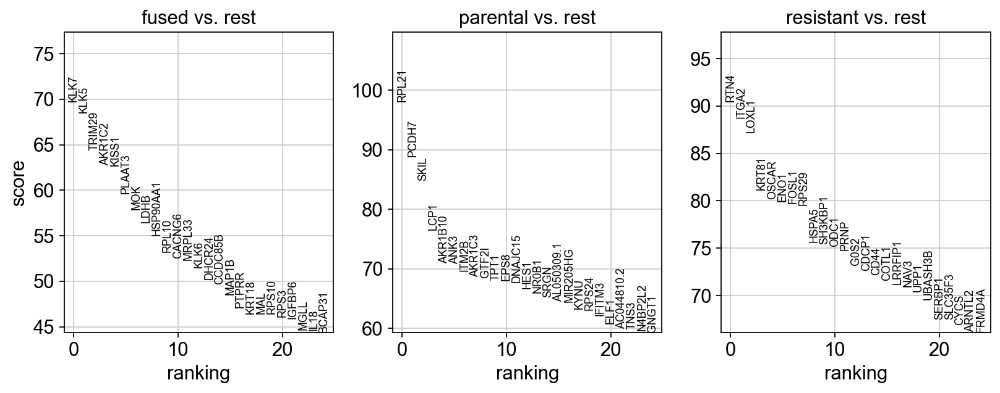

In [35]:
sc.tl.rank_genes_groups(adata_combined_filtered, "sample", method="wilcoxon")
sc.pl.rank_genes_groups(adata_combined_filtered, n_genes=25, sharey=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:54)


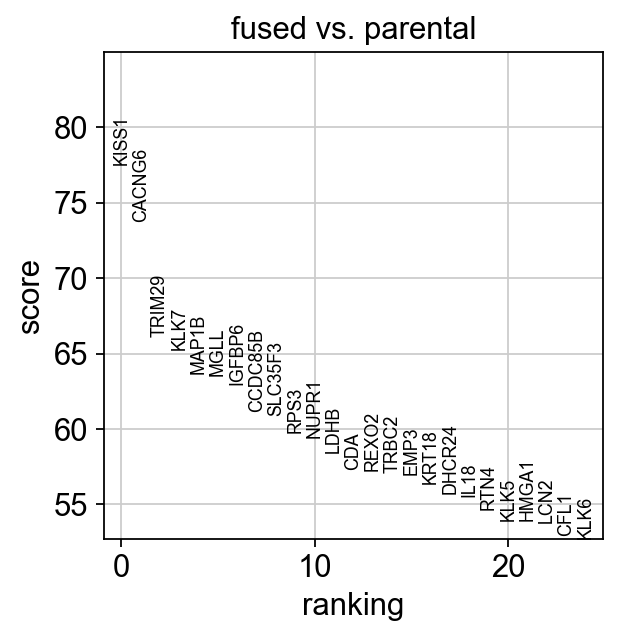

In [40]:
sc.tl.rank_genes_groups(adata_combined_filtered, "sample", groups = ["fused"], reference = "parental", method="wilcoxon")
sc.pl.rank_genes_groups(adata_combined_filtered, n_genes=25, sharey=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:47)


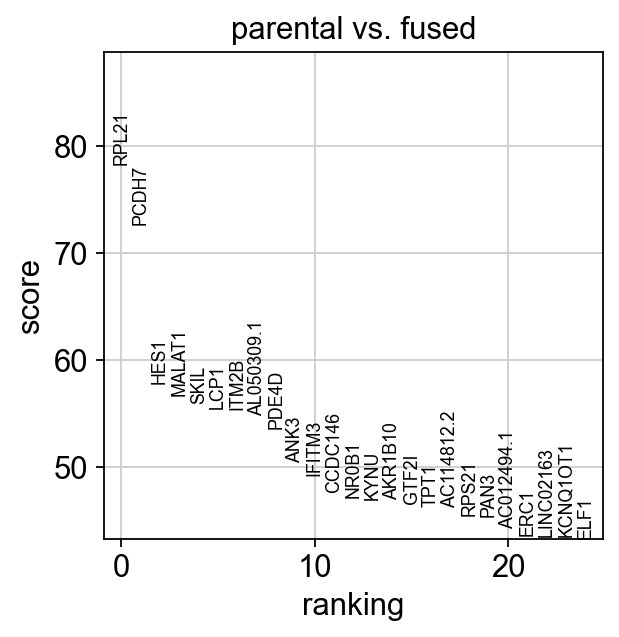

In [43]:
sc.tl.rank_genes_groups(adata_combined_filtered, "sample", groups = ["parental"], reference = "fused", method="wilcoxon")
sc.pl.rank_genes_groups(adata_combined_filtered, n_genes=25, sharey=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:39)


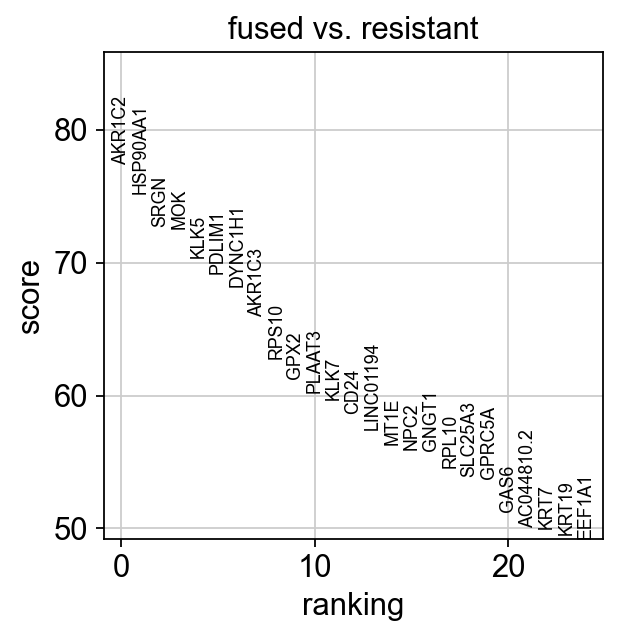

In [44]:
sc.tl.rank_genes_groups(adata_combined_filtered, "sample", groups = ["fused"], reference = "resistant", method="wilcoxon")
sc.pl.rank_genes_groups(adata_combined_filtered, n_genes=25, sharey=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:34)


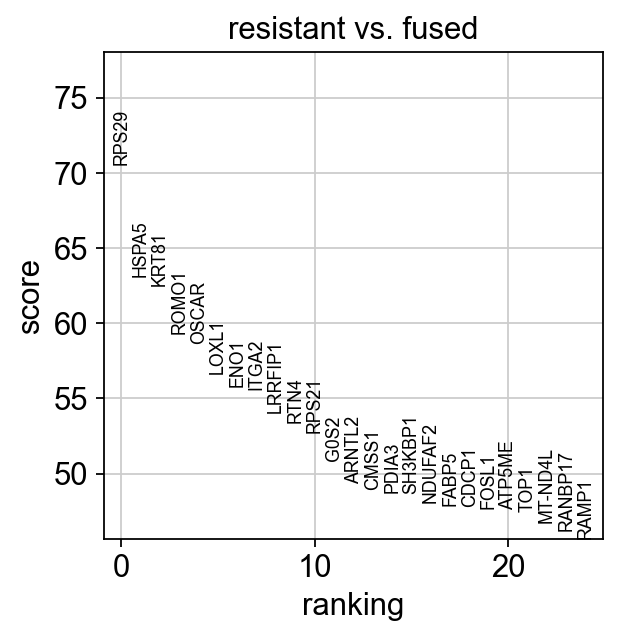

In [45]:
sc.tl.rank_genes_groups(adata_combined_filtered, "sample", groups = ["resistant"], reference = "fused", method="wilcoxon")
sc.pl.rank_genes_groups(adata_combined_filtered, n_genes=25, sharey=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:49)


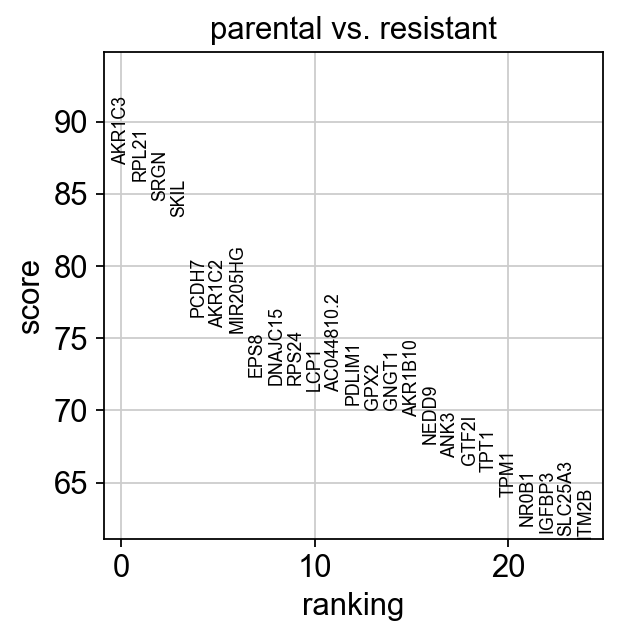

In [46]:
sc.tl.rank_genes_groups(adata_combined_filtered, "sample", groups = ["parental"], reference= "resistant", method="wilcoxon")
sc.pl.rank_genes_groups(adata_combined_filtered, n_genes=25, sharey=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:08)


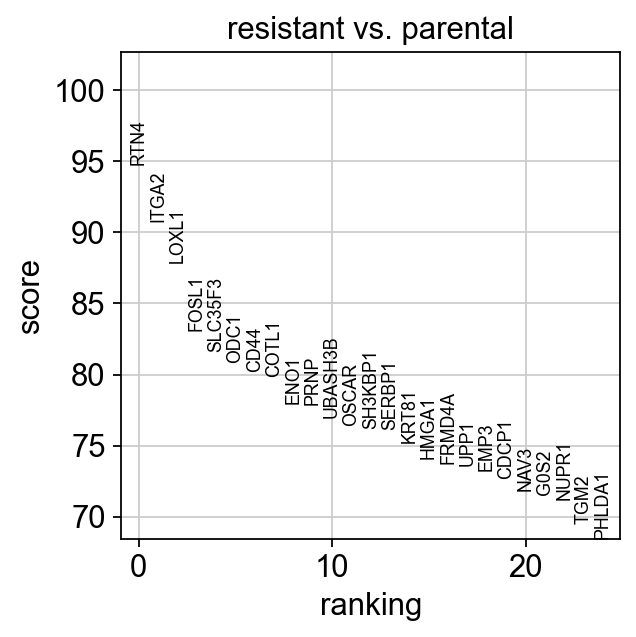

In [41]:
sc.tl.rank_genes_groups(adata_combined_filtered, "sample", groups = ["resistant"], reference= "parental", method="wilcoxon")
sc.pl.rank_genes_groups(adata_combined_filtered, n_genes=25, sharey=False)

# Cluster neighborhood graphs

running Leiden clustering
    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:05)


/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


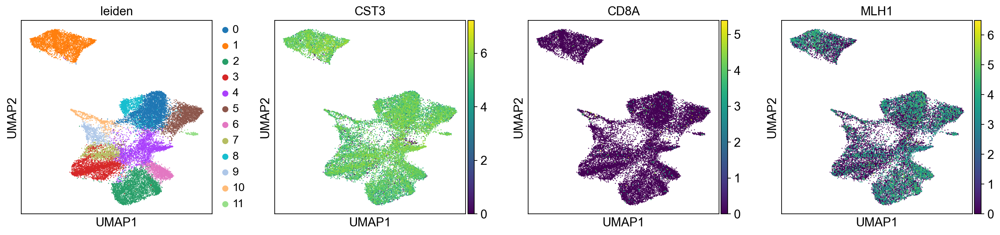

In [75]:
sc.tl.leiden(
    adata_combined_filtered,
    resolution=0.9,
    random_state=0,
    n_iterations=2,
    directed=False,
)

sc.pl.umap(adata_combined_filtered, color=["leiden", "CST3",'CD8A', 'MLH1'])

## Save

In [73]:
adata_combined_filtered.write(results_file)

# Identify marker genes

In [42]:
#sc.tl.rank_genes_groups(adata_fus_filtered, "leiden", method="t-test")
#sc.pl.rank_genes_groups(adata_fus_filtered, n_genes=25, sharey=False)

#I confirmed they are similar results and am now defaulting to Wilcoxon test as that is what they recommended

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:59)


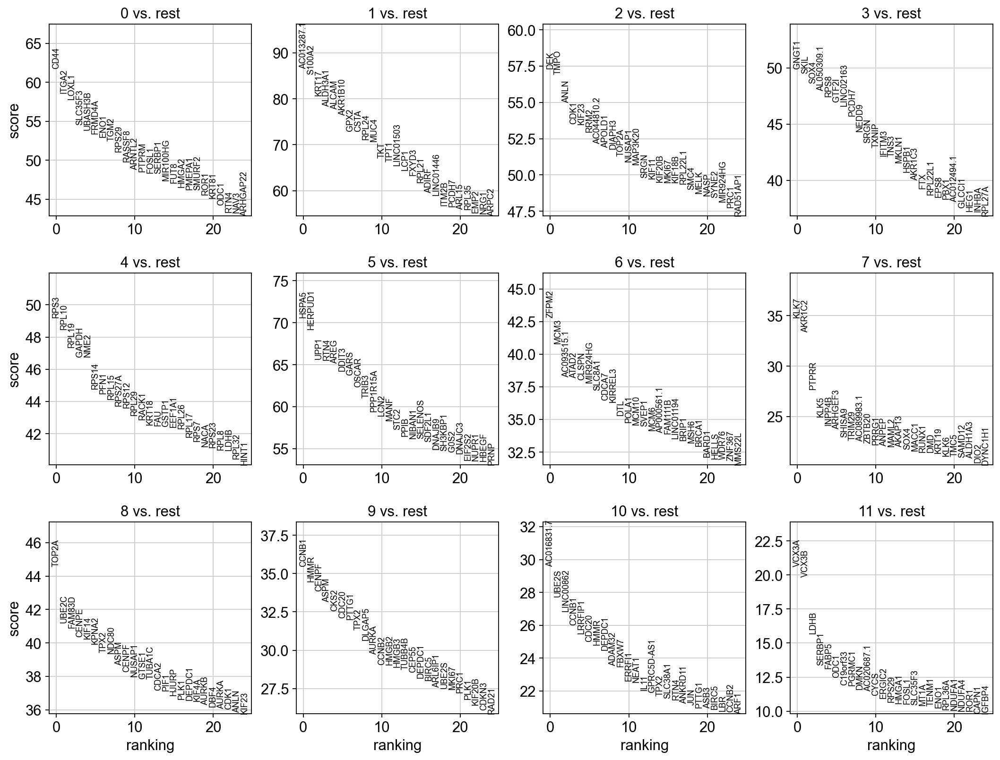

In [74]:
sc.tl.rank_genes_groups(adata_combined_filtered, "leiden", method="wilcoxon")
sc.pl.rank_genes_groups(adata_combined_filtered, n_genes=25, sharey=False)

Question: What marker genes should I be looking for?

--fusogens

--cell cycle markers/classic oncogenes

--control: what genes are normally expressed by PC9? can we confirm expression levels?


## Last step in tutorial: not relevant for samples with only one marker type :0

# Analyses we're interested in post-tutorial:

(0) (boring)validate: do we see the same info? same highly expressed genes?

(1) Gene set enrichment (GSE) + comparison b/n populations of cells (difference b/n bulk?)

(2) Which distinct transcript(s) are being highly expressed (select the genes based on sc-data and identify which transcripts for each were identified in bulk)

(3) create expression profiles for relevant fusogens: Syncytin-1 and syncytin-2; sars-cov-2 (spike protein)

(4) synthetic lethality question: can we identify gene fusions --> conclusions on lack of necessity for cell life (if associated with translocations/gene breaks etc.)

(5)(!!!!) are there chromosomal relationships/proximities at play?
    --hot/cold expression profiles in a chromosomal way/ mapping to the chromosomes
    
     null: random and not chromosomally-defined
     if yes: topologically associated domains/mapping
     follow-up: mutation frequency shifts associated with those regions
     
Bulk-seq:
(1) identify fused-genes in transcripts (not tagged in sc so won't show up)


    
  

define cloned and define resistant cells (from Dag)
compare bulk to scRNA

running Leiden clustering
    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:11)


/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


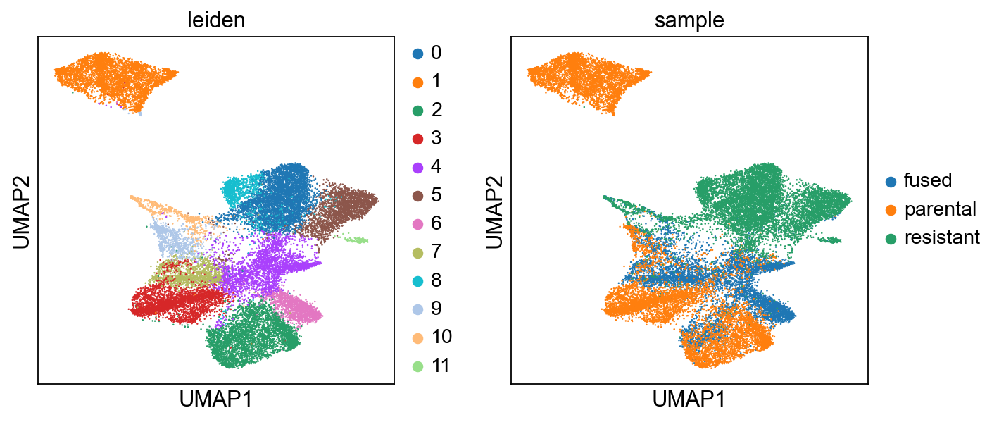

In [63]:
## continuting Feb 7 2025 -- evaluating clustering using silhouette scores

sc.tl.leiden( #leiden clustering algorithm is what determines number of clusters; tutorial has known number of cell types...
    adata_combined_filtered,
    resolution=.75,
    random_state=0,
    n_iterations=-1,
    directed=False,
)

sc.pl.umap(adata_combined_filtered, color=["leiden", "sample"])

In [64]:
adata_combined_filtered.obsm_keys()

['X_pca', 'X_umap']

Average silhouette score: 0.3685706
Average silhouette score for cluster 0: 0.17840155959129333
Average silhouette score for cluster 1: 0.797677755355835
Average silhouette score for cluster 2: 0.28410643339157104
Average silhouette score for cluster 3: 0.2767978608608246
Average silhouette score for cluster 4: 0.20253024995326996
Average silhouette score for cluster 5: 0.2945551574230194
Average silhouette score for cluster 6: 0.5938436985015869
Average silhouette score for cluster 7: 0.43521419167518616
Average silhouette score for cluster 8: 0.27959132194519043
Average silhouette score for cluster 9: 0.25352194905281067
Average silhouette score for cluster 10: 0.29821985960006714
Average silhouette score for cluster 11: 0.8247275352478027


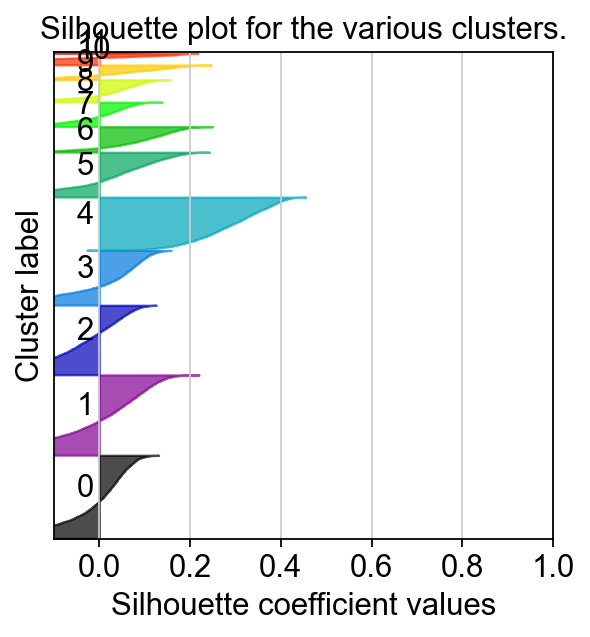

In [65]:
#outline of code generated by chatGPT

from sklearn.metrics import silhouette_samples, silhouette_score

# ... your Scanpy preprocessing steps (normalization, scaling, PCA, etc.) ...

# Assume 'adata' is your AnnData object after preprocessing
# and 'pca_coords' contains the PCA coordinates 

# Calculate silhouette score for each cluster

#First compute the silhouette score for all your points:
silhouette_avg = silhouette_score(adata_combined_filtered.obsm['X_umap'], adata_combined_filtered.obs['leiden'])
print("Average silhouette score:", silhouette_avg)

#Compute silhouette score for each cluster separately:
#This is not a built-in scanpy function, so you will have to adapt it based on your needs. 
#This is how you could potentially adapt it.
cluster_labels = adata_combined_filtered.obs['leiden'].values
n_clusters = len(np.unique(cluster_labels))

silhouette_samples_per_cluster = silhouette_samples(adata_combined_filtered.obsm['X_umap'], adata_combined_filtered.obs['leiden'])
silhouette_samples_per_cluster

for i in range(n_clusters):
    indices = np.where(cluster_labels ==str(i))
    #print(indices)
    cluster_silhouette_avg = np.mean(silhouette_samples_per_cluster[indices])
    print(f"Average silhouette score for cluster {i}: {cluster_silhouette_avg}")

#Visualize silhouette plots (optional but highly recommended)
#Import matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm

y_lower = 10
fig, ax1 = plt.subplots(1, 1)
ax1.set_xlim([-0.1, 1])
ax1.set_ylim([0, len(adata_combined_filtered)])
ax1.set_yticks([])
ax1.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])

colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)

for i in range(n_clusters):
    ith_cluster_silhouette_values = silhouette_samples(adata_combined_filtered.obsm['X_pca'], cluster_labels)[cluster_labels == str(i)]
    ith_cluster_silhouette_values.sort()
    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i
    color = cm.nipy_spectral(float(i) / n_clusters)
    ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values, facecolor=color, edgecolor=color, alpha=0.7)
    ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
    y_lower = y_upper + 10

ax1.set_title("Silhouette plot for the various clusters.")
ax1.set_xlabel("Silhouette coefficient values")
ax1.set_ylabel("Cluster label")

plt.show()

running Leiden clustering
    finished: found 9 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:15)


/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


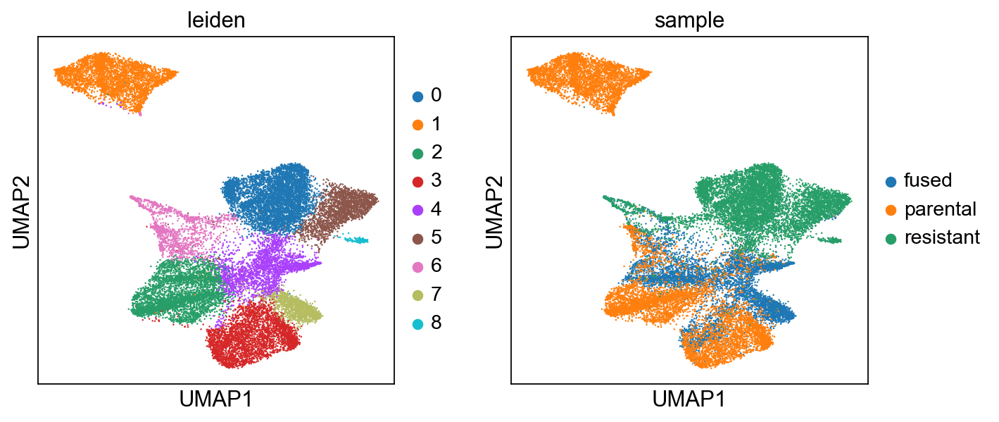

In [66]:
## continuting Feb 7 2025 -- evaluating clustering using silhouette scores

sc.tl.leiden( #leiden clustering algorithm is what determines number of clusters; tutorial has known number of cell types...
    adata_combined_filtered,
    resolution=.6,
    random_state=0,
    n_iterations=-1,
    directed=False,
)

sc.pl.umap(adata_combined_filtered, color=["leiden", "sample"])

Average silhouette score: 0.4553993
Average silhouette score for cluster 0: 0.37320512533187866
Average silhouette score for cluster 1: 0.8131785988807678
Average silhouette score for cluster 2: 0.46321818232536316
Average silhouette score for cluster 3: 0.2985817790031433
Average silhouette score for cluster 4: 0.28588005900382996
Average silhouette score for cluster 5: 0.3348109722137451
Average silhouette score for cluster 6: 0.47330889105796814
Average silhouette score for cluster 7: 0.5593538284301758
Average silhouette score for cluster 8: 0.8235219120979309


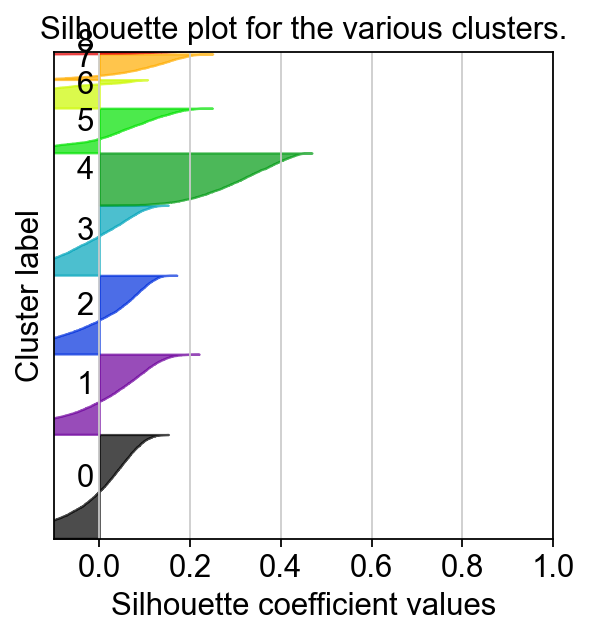

In [67]:
#outline of code generated by chatGPT

from sklearn.metrics import silhouette_samples, silhouette_score

# ... your Scanpy preprocessing steps (normalization, scaling, PCA, etc.) ...

# Assume 'adata' is your AnnData object after preprocessing
# and 'pca_coords' contains the PCA coordinates 

# Calculate silhouette score for each cluster

#First compute the silhouette score for all your points:
silhouette_avg = silhouette_score(adata_combined_filtered.obsm['X_umap'], adata_combined_filtered.obs['leiden'])
print("Average silhouette score:", silhouette_avg)

#Compute silhouette score for each cluster separately:
#This is not a built-in scanpy function, so you will have to adapt it based on your needs. 
#This is how you could potentially adapt it.
cluster_labels = adata_combined_filtered.obs['leiden'].values
n_clusters = len(np.unique(cluster_labels))

silhouette_samples_per_cluster = silhouette_samples(adata_combined_filtered.obsm['X_umap'], adata_combined_filtered.obs['leiden'])
silhouette_samples_per_cluster

for i in range(n_clusters):
    indices = np.where(cluster_labels ==str(i))
    #print(indices)
    cluster_silhouette_avg = np.mean(silhouette_samples_per_cluster[indices])
    print(f"Average silhouette score for cluster {i}: {cluster_silhouette_avg}")

#Visualize silhouette plots (optional but highly recommended)
#Import matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm

y_lower = 10
fig, ax1 = plt.subplots(1, 1)
ax1.set_xlim([-0.1, 1])
ax1.set_ylim([0, len(adata_combined_filtered)])
ax1.set_yticks([])
ax1.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])

colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)

for i in range(n_clusters):
    ith_cluster_silhouette_values = silhouette_samples(adata_combined_filtered.obsm['X_pca'], cluster_labels)[cluster_labels == str(i)]
    ith_cluster_silhouette_values.sort()
    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i
    color = cm.nipy_spectral(float(i) / n_clusters)
    ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values, facecolor=color, edgecolor=color, alpha=0.7)
    ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
    y_lower = y_upper + 10

ax1.set_title("Silhouette plot for the various clusters.")
ax1.set_xlabel("Silhouette coefficient values")
ax1.set_ylabel("Cluster label")

plt.show()

running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:16)


/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


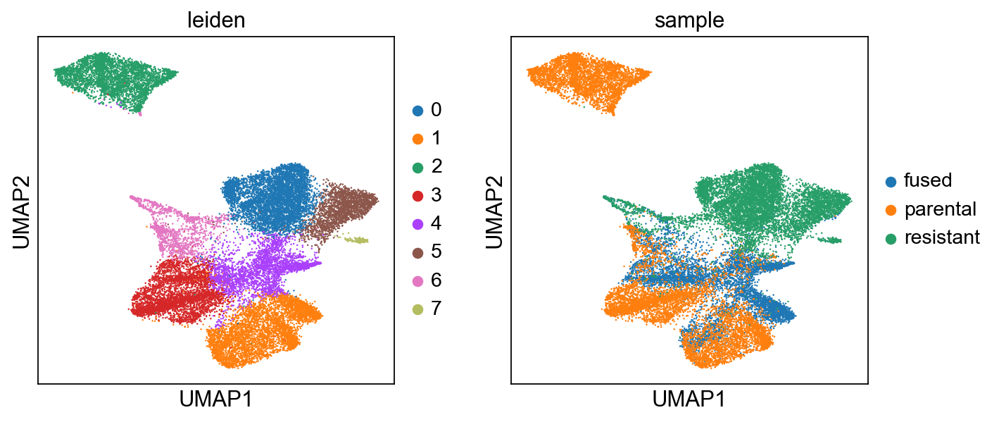

In [68]:
sc.tl.leiden( #leiden clustering algorithm is what determines number of clusters; tutorial has known number of cell types...
    adata_combined_filtered,
    resolution=.5,
    random_state=0,
    n_iterations=-1,
    directed=False,
)

sc.pl.umap(adata_combined_filtered, color=["leiden", "sample"])

Average silhouette score: 0.47049
Average silhouette score for cluster 0: 0.36294108629226685
Average silhouette score for cluster 1: 0.40827181935310364
Average silhouette score for cluster 2: 0.8130530714988708
Average silhouette score for cluster 3: 0.4949440062046051
Average silhouette score for cluster 4: 0.3210385739803314
Average silhouette score for cluster 5: 0.3521270751953125
Average silhouette score for cluster 6: 0.4930911660194397
Average silhouette score for cluster 7: 0.8384453654289246


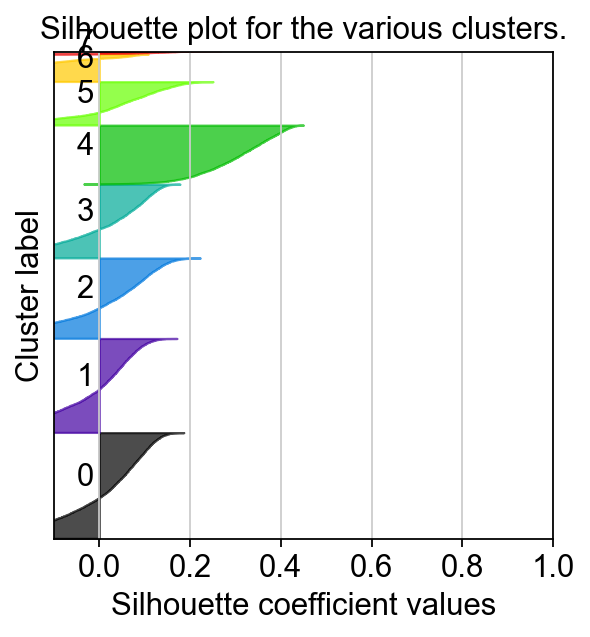

In [69]:
#outline of code generated by chatGPT

from sklearn.metrics import silhouette_samples, silhouette_score

# ... your Scanpy preprocessing steps (normalization, scaling, PCA, etc.) ...

# Assume 'adata' is your AnnData object after preprocessing
# and 'pca_coords' contains the PCA coordinates 

# Calculate silhouette score for each cluster

#First compute the silhouette score for all your points:
silhouette_avg = silhouette_score(adata_combined_filtered.obsm['X_umap'], adata_combined_filtered.obs['leiden'])
print("Average silhouette score:", silhouette_avg)

#Compute silhouette score for each cluster separately:
#This is not a built-in scanpy function, so you will have to adapt it based on your needs. 
#This is how you could potentially adapt it.
cluster_labels = adata_combined_filtered.obs['leiden'].values
n_clusters = len(np.unique(cluster_labels))

silhouette_samples_per_cluster = silhouette_samples(adata_combined_filtered.obsm['X_umap'], adata_combined_filtered.obs['leiden'])
silhouette_samples_per_cluster

for i in range(n_clusters):
    indices = np.where(cluster_labels ==str(i))
    #print(indices)
    cluster_silhouette_avg = np.mean(silhouette_samples_per_cluster[indices])
    print(f"Average silhouette score for cluster {i}: {cluster_silhouette_avg}")

#Visualize silhouette plots (optional but highly recommended)
#Import matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm

y_lower = 10
fig, ax1 = plt.subplots(1, 1)
ax1.set_xlim([-0.1, 1])
ax1.set_ylim([0, len(adata_combined_filtered)])
ax1.set_yticks([])
ax1.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])

colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)

for i in range(n_clusters):
    ith_cluster_silhouette_values = silhouette_samples(adata_combined_filtered.obsm['X_pca'], cluster_labels)[cluster_labels == str(i)]
    ith_cluster_silhouette_values.sort()
    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i
    color = cm.nipy_spectral(float(i) / n_clusters)
    ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values, facecolor=color, edgecolor=color, alpha=0.7)
    ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
    y_lower = y_upper + 10

ax1.set_title("Silhouette plot for the various clusters.")
ax1.set_xlabel("Silhouette coefficient values")
ax1.set_ylabel("Cluster label")

plt.show()

/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 3 The average silhouette_score is : 0.5736371


/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 4 The average silhouette_score is : 0.5365455


/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 5 The average silhouette_score is : 0.50321394


/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 6 The average silhouette_score is : 0.5002181


/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 7 The average silhouette_score is : 0.51065654


/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 8 The average silhouette_score is : 0.5081221


/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 9 The average silhouette_score is : 0.49845994


/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 10 The average silhouette_score is : 0.48707843


/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 11 The average silhouette_score is : 0.42513597


/Users/paulameena/opt/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 12 The average silhouette_score is : 0.4261973


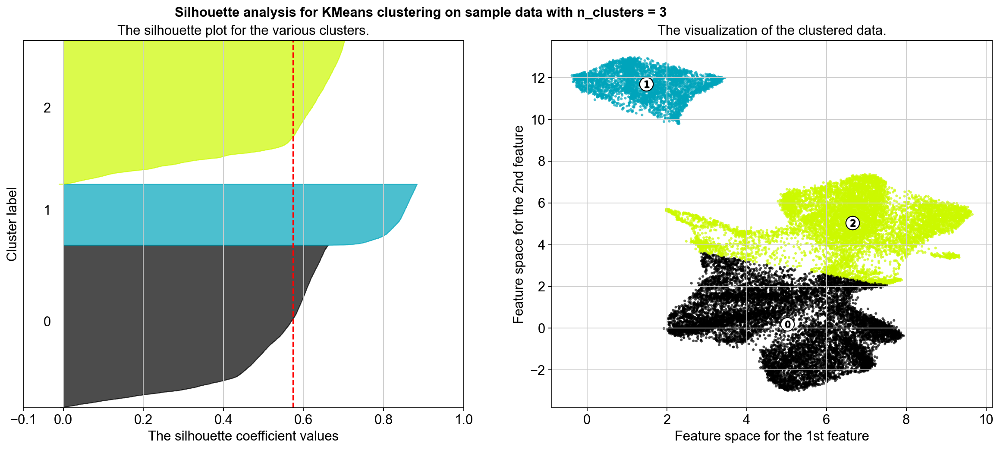

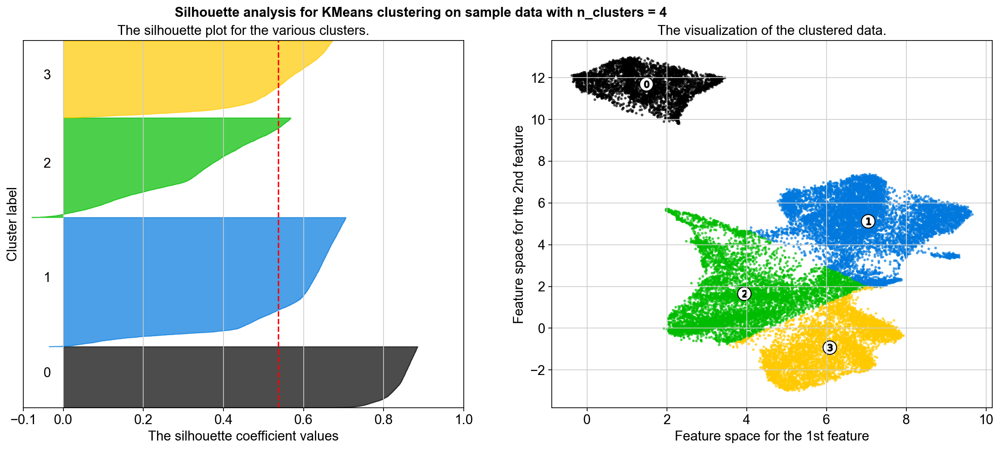

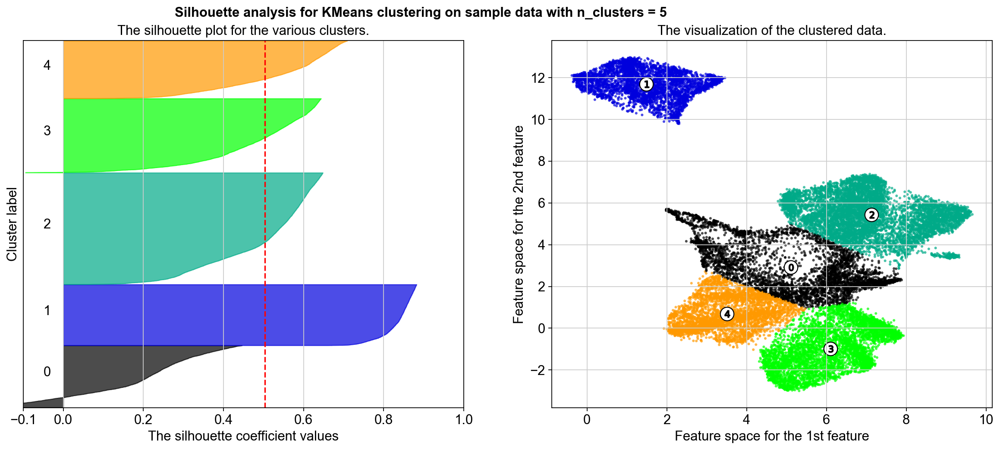

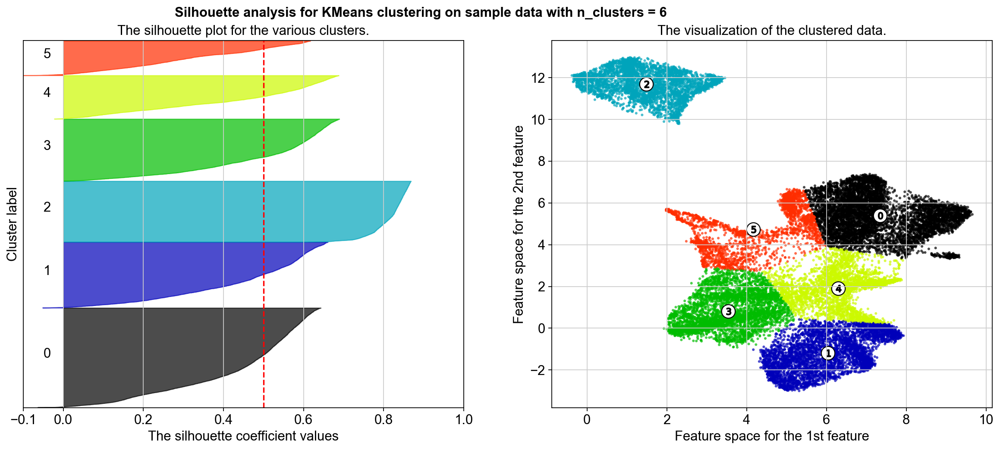

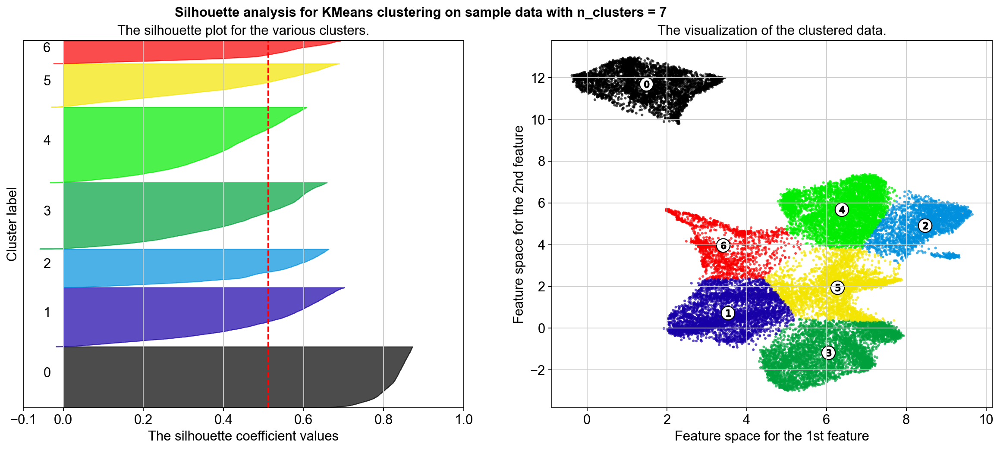

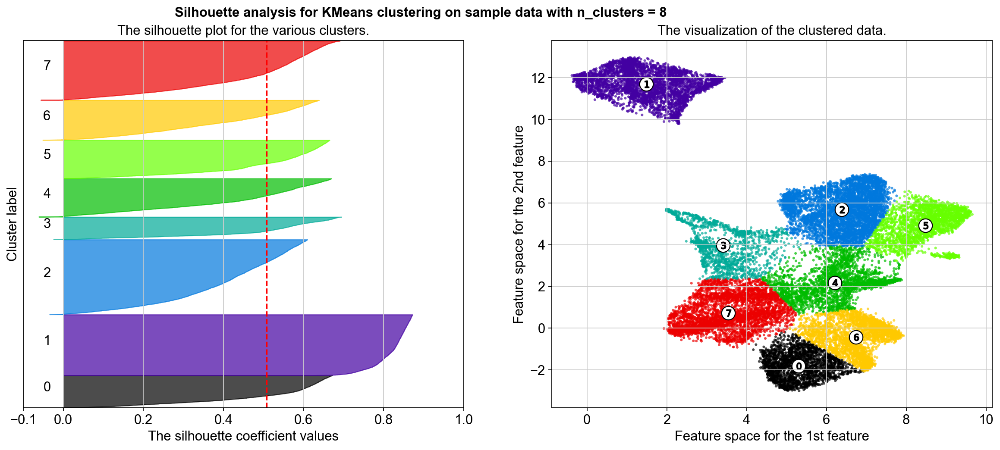

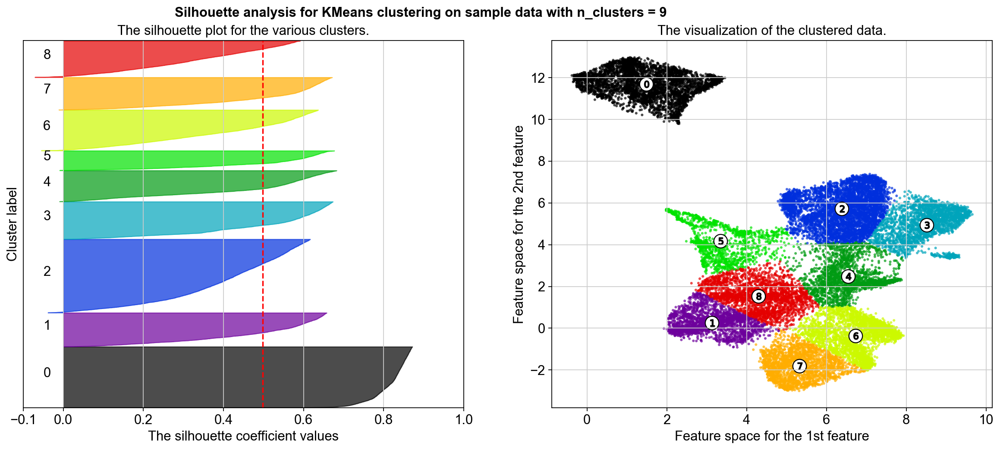

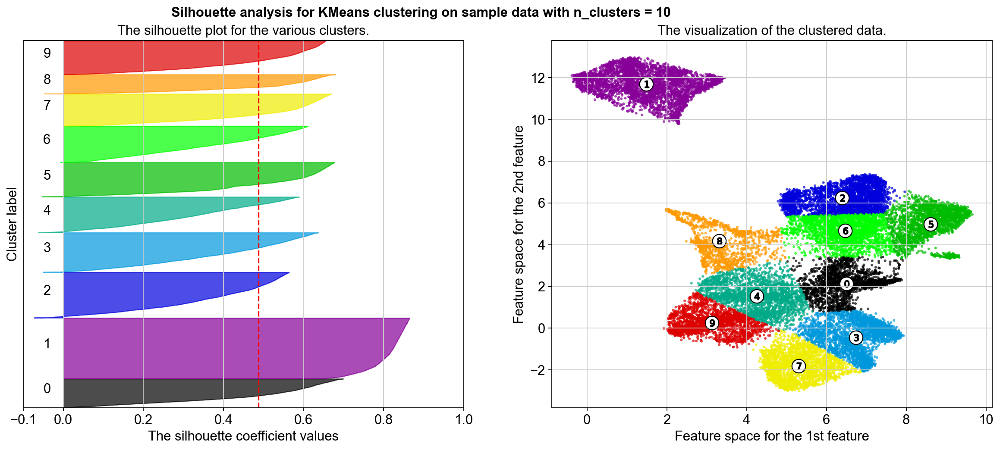

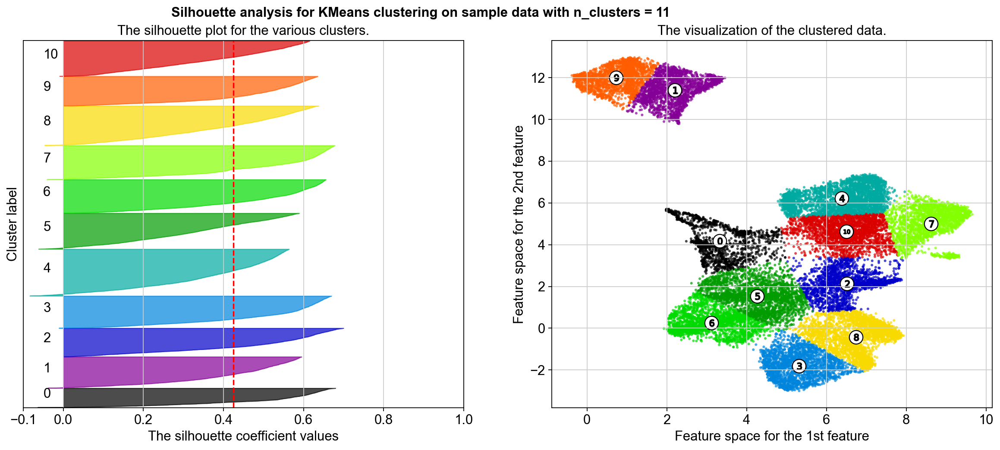

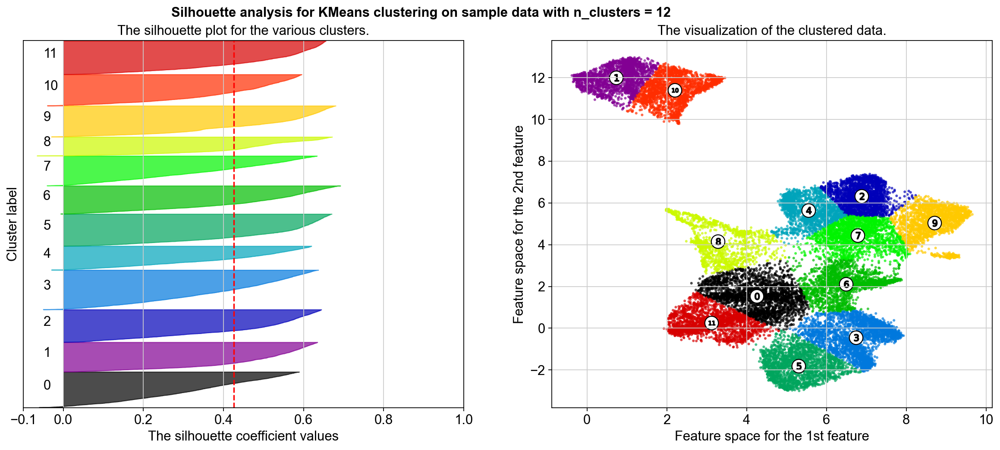

In [70]:
# Authors: The scikit-learn developers
# SPDX-License-Identifier: BSD-3-Clause
#using silhouette scores in combination with Kmeans clustering to identify optimal number of clusters

import matplotlib.cm as cm
import matplotlib.pyplot as plt
import numpy as np

from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_samples, silhouette_score

range_n_clusters = [3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

X = adata_combined_filtered.obsm["X_umap"]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

Arda: 

So I think you should not do Kmeans clustering, 1) the umap space is not a good space to do any analysis on just for visualization. For the gene expression space, K-means will not be optimal either due the number of features etc.. So your strategy should be; 1)for over 100(0) iterations: subsample both cells and genes by %90, cluster using leiden clustering with default parameters, keep track of which pair of cells are clustered together. 2) from the 100(0) iterations, calculate the frequency of pairwise occurrence, and do a final hierarchical clustering using silhouette as a metric. 3) Using the identified clusters, create a PAGA graph and subsequently create a UMAP using the PAGA initialization. The third step will give you a nice visualization overlapping with your clusters identified from 1-2
This will give you a robust clustering











In [94]:
adata_combined_filtered.var

,n_cells,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,highly_variable,means,dispersions,dispersions_norm,mean,std
AL627309.5,847,False,847,0.034725,96.599759,865.0,True,0.992834,4.361849,0.548743,2.539446e-11,0.691706
AL627309.4,11,False,11,0.000442,99.955841,11.0,True,0.033090,4.531545,0.988043,-5.928207e-13,0.090155
LINC01409,5686,False,5686,0.280249,77.173826,6981.0,True,2.590967,4.310128,0.520646,2.166994e-10,1.624729
AL645608.6,160,False,160,0.006544,99.357688,163.0,True,0.262224,4.392562,0.625789,4.105438e-11,0.300282
LINC02593,17,False,17,0.000682,99.931754,17.0,True,0.034105,4.474039,0.838155,2.036216e-11,0.099356
...,...,...,...,...,...,...,...,...,...,...,...,...
PRKY,55,False,55,0.002248,99.779205,56.0,True,0.103689,4.390999,0.621717,-4.320906e-11,0.178889
TTTY10,21,False,21,0.000843,99.915697,21.0,True,0.042041,4.545606,1.024692,2.984811e-11,0.109866
AC011043.2,16,False,16,0.000642,99.935769,16.0,True,0.039349,4.561728,1.066712,3.878908e-12,0.101712
AC011841.1,8,False,8,0.000321,99.967884,8.0,True,0.021646,4.842624,1.798856,3.797944e-12,0.072438


In [95]:
adata_combined_filtered.obs

,sample,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden
F_AAACCCACACCCTTGT-1,fused,3819,3819,8975.0,2151.0,23.966574,1
F_AAACCCACACGTAACT-1,fused,6973,6973,51756.0,1844.0,3.562872,4
F_AAACCCACAGAGCGTA-1,fused,7306,7306,38068.0,2042.0,5.364085,1
F_AAACCCAGTAGTGTGG-1,fused,4778,4778,22989.0,1738.0,7.560138,4
F_AAACCCAGTCTTTATC-1,fused,7446,7446,35597.0,2096.0,5.888136,1
...,...,...,...,...,...,...,...
R_TTTGGTTTCAGGACGA-1,resistant,7469,7468,35163.0,2448.0,6.961864,0
R_TTTGGTTTCGGTGAAG-1,resistant,5501,5501,20968.0,1697.0,8.093285,0
R_TTTGTTGAGATGGGCT-1,resistant,1541,1541,2534.0,422.0,16.653513,6
R_TTTGTTGAGCTGCCTG-1,resistant,7112,7112,34445.0,1912.0,5.550878,5


In [96]:
import anndata as ad

# Save the AnnData object to a .h5ad file
adata_combined_filtered.write_h5ad("adata_filtered_combined_feb2025.h5ad")